<center> 
    <h1> Desafio: Matching de Produtos</h1>
</center>

**Denis Andrei de Araujo** </p>
Julho de 2022

## Configuração do ambiente

In [1]:
!pip install -qr requirements.txt

In [3]:
import pandas as pd

import torch
from sentence_transformers import SentenceTransformer, util

import faiss
import numpy as np
import pickle
from pathlib import Path

import random

In [4]:
pd.set_option('display.max_columns', 50)
pd.set_option('display.max_rows', 1000)
pd.set_option('display.width', 1000)

## Carga e análise dos dados

In [5]:
df = pd.read_csv('data/base_info_produtos_EXTRA.csv')
df.head()

,nome,tipo,marca,categoria,cor,modelo,EXTRA_01,EXTRA_02,EXTRA_03,EXTRA_04,EXTRA_05,EXTRA_06,EXTRA_07,EXTRA_08,EXTRA_09,EXTRA_10,EXTRA_11,EXTRA_12
0,Samsung UN40C6900 LED Plana 40 Polegadas,TV,Samsung,Eletrônicos,None,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Sapateira Limeira Alta 30 Pares Tabaco - Polit...,Armario,Politorno,Casa e Decoração,None,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Faqueiro Tramontina Inox Laguna 66906760 20,Faqueiro,Tramontina,Casa e Decoração,Inox,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Cartucho de tinta HP 72 C9371A 130 Mls Ciano,Cartucho,HP,None,None,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Bolsa Pure Evo Medium Grip branco e preto - Puma,Bolsa,Puma,Moda e Acessórios,None,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


**Nota**: percebi que as últimas 12 colunas no arquivo de dados estavam sem nome associado e, por isto, não estavam sendo carregadas pelo Pandas. A fim de poder analisar o conteúdo destas colunas, defini manualmente os nomes para elas (EXTRA_01 a EXTRA_12) em um novo arquivo (base_info_produtos_EXTRA.csv).

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26241 entries, 0 to 26240
Data columns (total 18 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   nome       26241 non-null  object
 1   tipo       26241 non-null  object
 2   marca      26241 non-null  object
 3   categoria  26241 non-null  object
 4   cor        26238 non-null  object
 5   modelo     26241 non-null  object
 6   EXTRA_01   1731 non-null   object
 7   EXTRA_02   799 non-null    object
 8   EXTRA_03   464 non-null    object
 9   EXTRA_04   305 non-null    object
 10  EXTRA_05   180 non-null    object
 11  EXTRA_06   112 non-null    object
 12  EXTRA_07   73 non-null     object
 13  EXTRA_08   26 non-null     object
 14  EXTRA_09   13 non-null     object
 15  EXTRA_10   5 non-null      object
 16  EXTRA_11   4 non-null      object
 17  EXTRA_12   1 non-null      object
dtypes: object(18)
memory usage: 3.6+ MB


**Nota**: como pode-se ver acima, os campos extras contém pouquíssimos dados preenchidos (o campo EXTRA_01, que contém a maior quantidade de dados válidos, apresenta menos de 7% do total de linhas do dataframe). 

In [7]:
df.head()

,nome,tipo,marca,categoria,cor,modelo,EXTRA_01,EXTRA_02,EXTRA_03,EXTRA_04,EXTRA_05,EXTRA_06,EXTRA_07,EXTRA_08,EXTRA_09,EXTRA_10,EXTRA_11,EXTRA_12
0,Samsung UN40C6900 LED Plana 40 Polegadas,TV,Samsung,Eletrônicos,None,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Sapateira Limeira Alta 30 Pares Tabaco - Polit...,Armario,Politorno,Casa e Decoração,None,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Faqueiro Tramontina Inox Laguna 66906760 20,Faqueiro,Tramontina,Casa e Decoração,Inox,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Cartucho de tinta HP 72 C9371A 130 Mls Ciano,Cartucho,HP,None,None,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Bolsa Pure Evo Medium Grip branco e preto - Puma,Bolsa,Puma,Moda e Acessórios,None,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### Visualisando o conteúdo das colunas

**Notas**: 
1. nas próximas celular eu busco a visão completa dos dados, o que termina por deixar o processo de renderização um pouco mais lento. A execução das células desta seção, dependendo da quantidade de linhas geradas pelo comando **count**, podem levar dezenas de segundos. 
2. Não achei relevante gerar histogramas para estas colunas, uma vez que a visualização ordenada e formatada no modo texto com scrolling é suficiente para se verificar/analisar a distribuição de frequência.

In [8]:
df_tmp = pd.DataFrame(df['nome'].value_counts())
dfStyler = df_tmp.style.set_properties(**{'text-align': 'left'})
dfStyler.set_table_styles([dict(selector='th', props=[('text-align', 'left')])])

In [9]:
df_tmp = pd.DataFrame(df['tipo'].value_counts())
dfStyler = df_tmp.style.set_properties(**{'text-align': 'left'})
dfStyler.set_table_styles([dict(selector='th', props=[('text-align', 'left')])])

,tipo
Relógio,916
Game,846
Jogo de Lençol,582
Celular,447
Cartucho,430
Colchão,406
Notebook,393
Bicicleta,337
TV,330
Refrigerador,322


In [10]:
df_tmp = pd.DataFrame(df['marca'].value_counts())
dfStyler = df_tmp.style.set_properties(**{'text-align': 'left'})
dfStyler.set_table_styles([dict(selector='th', props=[('text-align', 'left')])])

,marca
Tramontina,834
HP,506
Samsung,379
Electrolux,342
Philips,297
Kacyumara,289
LG,259
Sony,239
Lorenzetti,236
Mattel,213


In [11]:
df_tmp = pd.DataFrame(df['categoria'].value_counts())
dfStyler = df_tmp.style.set_properties(**{'text-align': 'left'})
dfStyler.set_table_styles([dict(selector='th', props=[('text-align', 'left')])])

,categoria
Casa e Decoração,5414
Eletrodomésticos,3360
None,3264
Eletrônicos,2236
Moda e Acessórios,1891
Informática,1741
Cosméticos e Perfumaria,1272
Esporte e Lazer,1080
Construção e Ferramentas,1017
Bebês e Cia,635


In [12]:
df_tmp = pd.DataFrame(df['cor'].value_counts())
dfStyler = df_tmp.style.set_properties(**{'text-align': 'left'})
dfStyler.set_table_styles([dict(selector='th', props=[('text-align', 'left')])])

,cor
None,20934
Preto,1023
Branco,883
Inox,611
Casa e Decoração,284
Azul,245
Rosa,232
Prata,196
Vermelho,164
Eletrodomésticos,134


In [13]:
df_tmp = pd.DataFrame(df['modelo'].value_counts())
dfStyler = df_tmp.style.set_properties(**{'text-align': 'left'})
dfStyler.set_table_styles([dict(selector='th', props=[('text-align', 'left')])])

,modelo
None,19813
Casa e Decoração,126
Esporte e Lazer,37
Eletrônicos,36
200f,35
Informática,34
Branco,32
Bicicleta,30
Preto,30
60c,28


In [14]:
df_tmp = pd.DataFrame(df['EXTRA_01'].value_counts())
dfStyler = df_tmp.style.set_properties(**{'text-align': 'left'})
dfStyler.set_table_styles([dict(selector='th', props=[('text-align', 'left')])])

,EXTRA_01
None,1072
Eletrônicos,41
Esporte e Lazer,32
Informática,18
MP Player,16
Bicicleta,13
HDMI,13
Preto,13
Casa e Decoração,11
Moda e Acessórios,11


**Nota**: considerando-se as linhas contendo "None" como dado inválido, pode-se verificar acima que a coluna EXTRA_01 passa a ter em torno de 2,5% de dados válidos (1731 - 1072 = 659 / 26241 = 0,0251). Percebe-se uma redução significativa na quantidade de dados válidos. Além disso, observa-se que o conteúdo desta coluna é bastante similar ao das colunas **categoria** e **modelo** (e, em alguns casos, até mesmo ao conteúdo da coluna **cor**). Somando-se isto ao fato de que esta coluna sequer tinha nome, tudo isto leva a crer que a coluna é fruto de algum equívoco no momento de geração do arquivo. Dado este contexto, achei apropriado excluir a coluna EXTRA_01.

In [15]:
df_tmp = pd.DataFrame(df['EXTRA_02'].value_counts())
dfStyler = df_tmp.style.set_properties(**{'text-align': 'left'})
dfStyler.set_table_styles([dict(selector='th', props=[('text-align', 'left')])])

,EXTRA_02
None,444
Esporte e Lazer,53
Eletrônicos,18
Telefonia,13
Track e Bikes,12
Informática,9
GT Sound,8
Bicicleta,8
Construção e Ferramentas,8
Webcam,8


**Nota**: já pode-se perceber acima que as colunas EXTRA_02 tem-se menos de 1,4% de dados válidos (799 - 444 = 355 / 26241 = 0,0135). Dado este contexto, decidi não analisar o conteúdo dos demais campos. Além disso, achei também pertinente permanecer somente com o campo EXTRA_01 no dataframe, removendo os demais campos extras, uma vez que tem quantidade inexpressiva de dados.

In [16]:
# removendo colunas extras consideradas irrelevantes
df.drop(df.columns[6:], axis='columns', inplace=True)

In [17]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26241 entries, 0 to 26240
Data columns (total 6 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   nome       26241 non-null  object
 1   tipo       26241 non-null  object
 2   marca      26241 non-null  object
 3   categoria  26241 non-null  object
 4   cor        26238 non-null  object
 5   modelo     26241 non-null  object
dtypes: object(6)
memory usage: 1.2+ MB


### Preparando os dados para processamento no modelo

In [18]:
# Padronizando a representação de dados faltantes
df.fillna(np.nan, inplace=True)
df.replace([np.nan], [None], inplace=True)
df.replace(['None'], [None], inplace=True)

In [19]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26241 entries, 0 to 26240
Data columns (total 6 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   nome       26241 non-null  object
 1   tipo       26002 non-null  object
 2   marca      26230 non-null  object
 3   categoria  22977 non-null  object
 4   cor        5304 non-null   object
 5   modelo     6428 non-null   object
dtypes: object(6)
memory usage: 1.2+ MB


In [20]:
# Esta substituição é necessária para a concatenação
df.replace([None], [''], inplace=True)
#Criando coluna com a concatenação de todos os campos
df['concat'] = \
    df['nome']      + ' ' + \
    df['tipo']      + ' ' + \
    df['marca']     + ' ' + \
    df['categoria'] + ' ' + \
    df['cor']       + ' ' + \
    df['modelo']
# Removendo espaços em branco desnecessários da nova coluna criada
df['concat'].replace(r'\s+', ' ', regex=True, inplace=True)
#df['concat'].replace(r'^\s*', '', regex=True, inplace=True)

In [21]:
# visualizando a estrutura do dataframe após a inserção do campo concat
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26241 entries, 0 to 26240
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   nome       26241 non-null  object
 1   tipo       26241 non-null  object
 2   marca      26241 non-null  object
 3   categoria  26241 non-null  object
 4   cor        26241 non-null  object
 5   modelo     26241 non-null  object
 6   concat     26241 non-null  object
dtypes: object(7)
memory usage: 1.4+ MB


## Metodologia para a busca da solução

Por entender que as 3 demandas/perguntas do desafio estão intrinsecamente relacionadas às funcionalidades de **busca semântica**, optei por utilizar o framework [Sentence-Tranformers](https://www.sbert.net) para a implementação da solução.
No momento da leitura do desafio eu já havia intuitivamente identificado a **busca semântica** como solução para responder às questões do desafio. Mesmo assim, optei por dedicar os dois primeiros dias para verificar quais seriam as abordagens geralmente escolhidas para solucionar a questão de matching de produtos. Na rápida pesquisa que fiz, verifiquei que o matching de produtos é comumente associado a aplicação de Redes Siamesas sobre embeddings, variando-se fundamentalmente o algoritmo de embedding (Glove, FastText, word2vec, etc) e o tipo de rede neural (LSTM, Bert, etc).

O framework **Sentence-Transformers** é implementado sobre o [S-Bert](https://arxiv.org/pdf/1908.10084.pdf), um rede siamesa que usa o **Bert** para a geração dos embeddings. 

A escolha desta abordagem como solução para o desafio tem como principais motivadores o fato de eu ter experiência anterior positiva com o framework Sentence-Transformers em contexto semelhante (embora o domínio dos experimentos anteriores tenha sido diferente), bem como o fato da compatibilidade de arquitetura com o "estado da arte" em matching de produtos. Também pode-se citar como motivador o uso de Transformers (que eu considero um marco realmente importante para a PLN e até mesmo para a IA como um todo). O uso de Transformers em problemas do mundo real é, em minha opinião, um fator a ser investigado sempre, uma vez que não raro os resultados obtidos são significativamente melhores.

## Questões do desafio

### a) Dado dois produtos, qual a probabilidade de eles serem o mesmo produto?

#### Criação do modelo

In [22]:
model_name = 'all-mpnet-base-v2'
model = SentenceTransformer(model_name)

**Nota**: o matching de produtos apreenta-se como um contexto de [busca semântica simétrica](https://www.sbert.net/examples/applications/semantic-search/README.html#symmetric-vs-asymmetric-semantic-search), tendo então diversas opções de [modelos disponíveis no Sentence-Transformers](https://www.sbert.net/docs/pretrained_models.html#model-overview). O modelo **all-mpnet-base-v2** foi selecionado por ter apresentado melhor desempenho).

In [23]:
# teste para confirmar a disponibilidade de GPU
if torch.cuda.is_available():
    model = model.to(torch.device("cuda"))
    print(f'O modelo está carregado na GPU {model.device}')
else:
    print("IMPORTANTE: a ausência de GPU tem grande impacto NEGATIVO no tempo de execução da indexação e busca dos produtos!")

O modelo está carregado na GPU cuda:0


#### Implementação da solução para a questão

In [24]:
%%time

# Definindo estaticamente o nome dos produtos a comparar
#produto1 = 'Tapete preto firenza'
#produto2 = 'Jogo de Tapetes Interlagos c/ 4 peças na cor Preta'

# Buscando nomes de produtos aleatoriamente
produto1 = df['nome'][random.randrange(0,len(df))]
produto2 = df['nome'][random.randrange(0,len(df))]

#Gera os embeddings para ambos os produtos
embeddings1 = model.encode([produto1], convert_to_tensor=True)
embeddings2 = model.encode([produto2], convert_to_tensor=True)

#Calcula a similaridade entre os produtos usando cosine-similarities
cos_score = util.cos_sim(embeddings1, embeddings2)
dot_score = util.dot_score(embeddings1, embeddings2)

print(f"Produto 1: {produto1}")
print(f"Produto 2: {produto2}")
print(f"Cos score: {cos_score[0][0]}")
print(f"Dot score: {dot_score[0][0]}\n\n")

Produto 1: Philips HQ7320
Produto 2: Lavadora de Roupa 10kg Prime WD-1409FD - Branca - LG
Cos score: 0.33820417523384094
Dot score: 0.33820417523384094


CPU times: user 30.2 ms, sys: 572 µs, total: 30.8 ms
Wall time: 27.3 ms


#### Resposta à questão A

Na abordagem escolhida, utiliza-se métricas de distância entre os embeddings para avaliar-se a similaridade entre as strings.
Pode-se usar esta distância como um indicador de quão semelhante são os produtos (quanto menor a distância, mais semelhantes). 

Na célula acima está sendo usando as duas opções de verificação de similiridades [disponíveis no do Sentence-Transformers](https://www.sbert.net/docs/package_reference/util.html): similaridade pelo coseno e pela operação matricial *inner dot product*.

Pode-se, via experimentos empíricos, determinar-se qual o algoritmo de similaridade mais apropriado e também o valor mínimo de similaridade para decidir se são ou não os mesmo produtos.

A similaridade por distância entre os embeddings não é uma probabilidade, mas acredito que o objetivo da questão não seja usar probabilidade, mas sim definir uma forma de identificar similiridade entre produtos. Caso deseje-se realmente a probabilidade, pode-se realizar testes estatísticos para determinar a probabilidade, utilizando as medidas de similaridade como componente do cálculo.

### b) Como usar a solução de matching para retornar os produtos mais relevantes para uma busca simples feita por um cliente do site.

#### Implementação da solução para a questão

##### Criação dos embeddings

In [25]:
embeddings = model.encode(df['concat'].to_list(), show_progress_bar=True)

Batches: 100%|████████████████████████████████| 821/821 [00:28<00:00, 29.12it/s]


In [26]:
embeddings.shape
# qtde de dados X tamanho do array de embeddings

(26241, 768)

##### Visualizando os embeddings

Esta seção tem por objetivo permitir a visualização dos embedding produzidos pelo Sentence-Transformers.
Há uma grande variedade de abordagens para a redução de dimensionalidade (PCA, t-SNE, UMAP, etc).
Em outros experimentos realizados, geralmente os melhores resultados para a visualização em 2 ou 3 dimensões dos embeddings criados pelo SentenceTransformers foram obtidos pelo algoritmo [UMAP](https://umap-learn.readthedocs.io).
Por isto decidi adotá-lo aqui também.

In [27]:
import umap
import umap.plot

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

In [28]:
print('ATENÇÃO: execução desta célula pode levar mais de 1 minuto...')
umap_2D = umap.UMAP().fit(embeddings)

ATENÇÃO: execução desta célula pode levar mais de 1 minuto...
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


In [29]:
# Quantidade de categorias a serem vistas individualmente no gráfico
n_categ_principais = 20
#cria a lista de categorias a ser vista no gráfico
categorias_principais = df['categoria'].value_counts().head(n_categ_principais).index.to_list()
df_labels = pd.DataFrame(df['categoria'])
# Renomeia todas as demais categorias para "Outros"
df_labels.loc[~df_labels["categoria"].isin(categorias_principais), "categoria"] = "Outros"
# Atribui o "Não Informada" aos dados sem categoria
df_labels['categoria'].replace('', 'NÃO INFORMADO', inplace=True)
df_labels['categoria'].value_counts().head(n_categ_principais)
# Categorias e respectivos contadores

Casa e Decoração            5414
Eletrodomésticos            3360
NÃO INFORMADO               3264
Eletrônicos                 2236
Moda e Acessórios           1891
Informática                 1741
Outros                      1730
Cosméticos e Perfumaria     1272
Esporte e Lazer             1080
Construção e Ferramentas    1017
Bebês e Cia                  635
Brinquedos                   563
Telefonia                    509
Papelaria e Escritório       335
Automóveis e Veículos        290
Games                        240
Kit                          239
Saúde                        173
Alimentos e Bebidas          163
Instrumentos Musicais         49
Name: categoria, dtype: int64

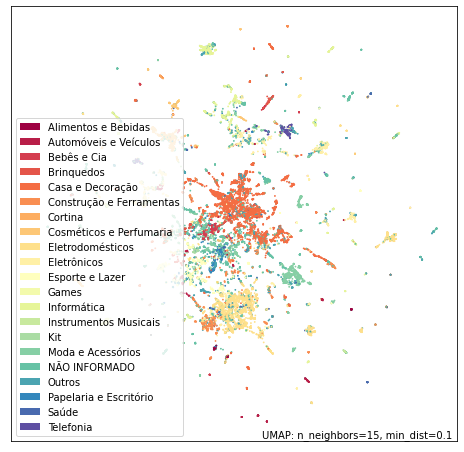

In [31]:
p = umap.plot.points(umap_2D, labels=df_labels['categoria'])
umap.plot.show(p)

**Nota**: é interessante ressaltar que o gráfico acima está somente mostrando os embeddings de 768 dimensões reduzidos para 2 dimensões pelo UMAP, tendo sido os pontos colorizados com base na categoria do produto. A colorização dos pontos tem como objetivo verificar se detectamos agrupamento dos embeddings em relação às suas **categorias**, uma vez que o alvo do desafio é encontrar uma abordagem que "aproxime" os produtos semelhantes. Pode-se perceber no gráfico acima que temos uma tendência à formação de grupos de categorias, o que é um indício preliminar de que o uso dos embeddings tende a ser um bom fator para agrupar os produtos semalhantes.

No próximo gráfico (abaixo), vamos colorir os (mesmos) pontos, mas agora com base no **tipo** de produto, o que novamente vai nos permitir verificar a formação de agrupamentos por esta feature também.

In [32]:
# Quantidade de tipos a serem vistos individualmente no gráfico
n_tipos_principais = 38
#cria a lista de tipos a ser visto no gráfico
tipos_principais = df['tipo'].value_counts().head(n_tipos_principais).index.to_list()
df_labels = pd.DataFrame(df['tipo'])
# Renomeia todas as demais categorias para "Outros"
df_labels.loc[~df_labels["tipo"].isin(tipos_principais), "tipo"] = "Outros"
# Atribui o "Não Informada" aos dados sem categoria
df_labels['tipo'].replace('', 'NÃO INFORMADO', inplace=True)
df_labels['tipo'].value_counts().head(n_tipos_principais)

# Tipos e respectivos contadores

Outros                15312
Relógio                 916
Game                    846
Jogo de Lençol          582
Celular                 447
Cartucho                430
Colchão                 406
Notebook                393
Bicicleta               337
TV                      330
Refrigerador            322
Câmera Digital          314
Edredom                 310
Perfume                 277
Fogão                   267
Cadeira                 258
Aparelho de Som         252
Ventilador              246
NÃO INFORMADO           239
Roupão                  234
Lavadora de Roupa       234
Exaustor                230
Boneca                  225
Faqueiro                204
Suporte                 199
Bolsa                   196
Cama                    194
Secador                 189
Armario                 185
Aparelho de Jantar      179
Piscina                 178
MP Player               178
Tênis                   177
Barbie                  170
Forno                   164
Mouse               

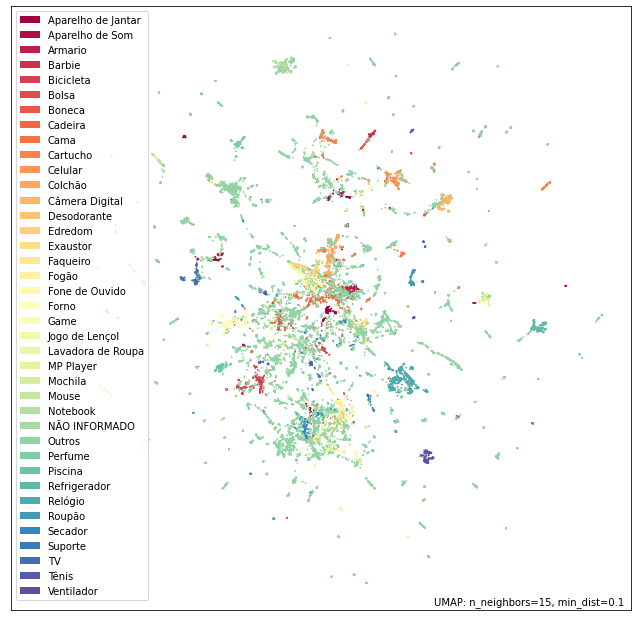

In [34]:
p = umap.plot.points(umap_2D, labels=df_labels['tipo'])
umap.plot.show(p)

**Nota**: diferentemente da coluna **categoria**, que tem uma distribuição de frequência mais concentrada, a distribuição de frequência da coluna **tipo** é mais dispersa, fazendo com que a maior parte dos produtos fosse classificado com o tipo OUTROS. Isto fez com o que o tipo OUTROS predominasse significativamente e, embora ainda fosse possível perceber a formação de agrupamentos, reduziu significativamente a utilidade do gráfico. 

A fim de permitir a visualização de mais grupos de tipos, aumentei para 38 a quantidade de tipos a serem visualizados individualmente, o que resultou em uma pequena diminuição do grupo OUTROS. No entanto, devido a quantidade de tipos visíveis, o gráfico está apresentando um grande número de cores semelhantes, o que novamente dificulta a identificação dos grupos.

Poderia-se contornar estes problemas trabalhando-se com gráficos 3D e interativos, como os obtidos com o [Plotly](https://plotly.com/), por exemplo. Estes gráficos interativos permitiriam-nos definir os grupos a serem visualizados, aproximar e afastar os pontos, bem como outros recursos de visualização que resolveriam em grande parte os problemas de visualização apontados acima.

No entanto, por considerar que a visualização não é o objetivo principal deste trabalho, não vou implementar estas alternativas. Até porque, para o correto funcionamento do Plotly, é necessário instalar um plugin específico no Jupyter Lab, havendo então um risco de sequer ser possível visualizar o resultado no momento de rodar este notebook em outras instalações do Jupyter.

Acredito que as visualizações de grupos acima é um bom indicativo, mas o que vai realmente demonstrar a utilidade/aderência da abordagem escolhida serão os testes que vou realizar a seguir com os embeddings.

##### Indexando os Embeddings com [Faiss](https://github.com/facebookresearch/faiss)

In [35]:
%%time
# Para o uso do Faiss é necessário converter o tipo dos embedding para float32
embeddings = np.array([embedding for embedding in embeddings]).astype("float32")

# Indexando os embeddings
index = faiss.IndexFlatL2(embeddings.shape[1])

# Convertendo o indice criado para IndexIDMap
index = faiss.IndexIDMap(index)

# Acrescentando o indice do dataframe de produtos como ID
index.add_with_ids(embeddings, df.index.values)

print(f"Número de vetores indexados no Faiss: {index.ntotal}")

Número de vetores indexados no Faiss: 26241
CPU times: user 53.3 ms, sys: 28.2 ms, total: 81.5 ms
Wall time: 80.7 ms


In [36]:
# quantidade de produtos similares a serem mostrados
n_mais_proximos = 15

# definição estática do produto
#query_string = "bicicleta para meninos"

# buscando um produto aleatório
query_string = df['nome'][random.randrange(0,len(df))]
query_string

'Global Beauty AT2005 Cerâmica'

In [37]:
%%time
# Buscando query_string via Faiss

vector = model.encode([query_string])
D, I = index.search(np.array(vector).astype("float32"), k=n_mais_proximos)
result = [list(df[df.index == idx]['nome']) for idx in I[0]]
result = [f"{r[0]}" for r in result]

CPU times: user 86.7 ms, sys: 104 ms, total: 191 ms
Wall time: 143 ms


In [38]:
df_result = pd.DataFrame(list(zip(I[0], result, D[0])),
               columns =['índice', 'produto', 'distância'])
df_result

,índice,produto,distância
0,5860,Global Beauty AT2005 Cerâmica,0.214560
1,6209,Mesa de Centro Artely Italy - Branco c/ Preto ...,0.839679
2,8965,"Modelador Ceramic 0,75"" Bivolt - Mega",0.866363
3,13126,Modelador Turmalina Ion Cerâmica 25mm - Mega,0.898271
4,307,Britânia Aqua Cerâmica,0.907519
5,4378,Chapinha / Prancha Taiff Elegance SuperMini Ce...,0.930493
6,208,Mesa de Centro Saara Tabaco Brilhante c/ Branc...,0.930778
7,238,Saboneteira de Metal LorenLuna 2008 C41 - Lore...,0.935125
8,24380,Taiff Tourmaline Íon Cerâmica,0.953980
9,20375,"Modelador Tourmaline Íon Cerâmica 3/4"" - Bivo...",0.958530


#### Resposta à questão B

A solução para a questão B baseou-se na inclusão de um novo campo chamado **concat** o qual contém todas as informações relativas ao produto (nome, tipo, marca, categoria, cor e modelo), as quais foram concatenadas com um espaço em branco. Dessa forma, a busca por produtos semelhantes pode ser feita utilizando-se quaisquer de seus atributos.

Gerou-se então os embeddings para o campo **concat**, os quais foram armazenados em um banco de dados em memória (via Faiss). Os embeddings foram associados/relacionados aos produtos através do índice do dataframe de produtos (**df**).

A busca de produtos semelhantes é feita através da geração do embedding da string de busca (**query_string**), o qual então é utilizado para busca no Faiss (através do método **search**), passando-se também a quantidade de embeddings próximos/semelhantes que deseja-se como retorno.

São retornadas duas listas, contendo os índices e as distâncias, ordenadas de forma crescente pela distância. Estas listas são então utilizadas para mostrar os nomes dos produtos mais semelhantes à string de busca **query_string**.

Temos assim implementado um sistema de busca simples que pode ser usado por um cliente do site.

### c) Dado um título de produto, como extrair as informações de tipo, categoria, marca, cor e modelo?

In [39]:
# qtos produtos similares mostrar
n_mais_proximos = 1

# definição estática do produto
#query_string = "Samsung N150 Intel Atom N455 1.66"

# buscando um produto aleatório
query_string = df['nome'][random.randrange(0,len(df))]

query_string

'GE Modular Elétrico 80cm CTEGE080S512VT Cooktop 4 Bocas Preto'

In [40]:
%%time
# Buscando query_string via Faiss
vector = model.encode([query_string])
D, I = index.search(np.array(vector).astype("float32"), k=n_mais_proximos)
result = [list(df[df.index == idx]['nome']) for idx in I[0]]
result = [f"{r[0]}" for r in result]

CPU times: user 36 ms, sys: 8.02 ms, total: 44 ms
Wall time: 39.8 ms


In [41]:
df_tmp = df.loc[list(I[0])].copy()
df_tmp.replace('','None', inplace=True)
df_tmp.drop(['concat'], axis='columns', inplace=True)
dfStyler = df_tmp.style.set_properties(**{'text-align': 'left'})
dfStyler.set_table_styles([dict(selector='th', props=[('text-align', 'left')])])

,nome,tipo,marca,categoria,cor,modelo
12004,GE Modular Elétrico 80cm CTEGE080S512VT Cooktop 4 Bocas Preto,Cooktop,GE,Eletrodomésticos,None,None


#### Resposta à questão C

Pode-se observar que a implementação da solução para a questão C é praticamente a mesma da solução B. Isto deve-se ao fato de que a implementação da solução B baseia-se em relacionamento por índice, sendo então reaproveitável a mesma abordagem para a questão C.

Uma possível diferença que poderia haver na implementação da solução C seria gerar os embeddings a partir do campo **nome** (na solução B, os embeddings são gerados a partir do campo **concat**), pois a questão C explicita que vai-se utilizar para consulta somente o título do produto. Eu avaliei que o uso do campo **concat** para a realização das buscas seria aceitável/apropriado para atender ao solicitado na questão C.

Outro ponto que acho importante salientar na implementação da solução C é que estou reaproveitando o mesmo dataframe **df** para apresentar os dados pedidos, tendo então que fazer alguns ajustes para atender ao que foi solicitado na questão C:

1. Substituição dos campos vazios (**''**) pela string **"None"**
2. Remoção do campo **concat**

Novamente acho importante frisar que os ajustes acima poderiam ser facilmente evitados, bastando-se fazer uma cópia do dataframe original, mas entendi que não seria necessário este nível de preciosismo no contexto do desafio aqui proposto. Como a solução é totalmente baseada em índice, poderia-se buscar as colunas **tipo, marca, categoria, cor e modelo** do dataframe original, que não conteria a coluna **concat** e teria os campos vazios preenchidos com **None**. 

## Considerações finais

Apresentou-se neste notebook uma abordagem para matching de produtos baseada em embedding de texto, utilizando-se o framework **Sentence-Transformers** para geração dos embeddings e o **Faiss** para indexação e busca.

Embora saiba-se que os Transformers estejam tornando-se cada vez mais o padrão de fato para a implementação de soluções de PLN, pode-se apontar como um trabalho futuro a estruturação de uma metodologia de avaliação para matching de produto e então comparar-se os resultados com outras abordagens, como as Redes Siamesas baseadas em diferentes arquiteturas de rede neural artificial e diferentes algoritmos de embeddings, tais como o FastText, Glove, word-embeddings, etc.

Além disso, definido um processo de comparação de desempenho, poderia-se também realizar experimentos com os [diversos modelos que o Sentence-Transformers suporta](https://www.sbert.net/docs/pretrained_models.html). Outra possibilidade seria a realização de [fine-tuning dos modelos](https://www.sbert.net/docs/training/overview.html#continue-training-on-other-data) para "personalizar" os modelos ao vocabulário específico do domínio em vista.

Ainda seria importante dizer em relação ao uso do Sentence-Transformers para busca semântica (ou matching textual) que temos disponível o [Haystack](https://haystack.deepset.ai/overview/intro), um framework opensource maduro que tem como objetivo simplificar o uso de Transformers em tasks de PLN. O Haystack automatiza o pipeline necessário para o uso de Transformers, simplificando/abstraindo de tal forma a implementação que poderia ser considerado como um framework de **low code**. O HayStack está para o uso de Transformers em tasks de PLN como o Pycaret está para os modelos de classificação e regressão. O principal benefício do uso Haystack é simplificar consideravelmente os algoritmo para uso de Transformers. O Haystack somente não foi utilizado neste notebook porque entendi ser mais apropriado demonstrar meu conhecimento sobre busca semântica utilizando Transformers. Caso tivesse usado o Haystack, teríamos uma expressiva redução de linhas de código necessárias para a implementação de busca semântica (acredito que para algo em torno de 20 linhas). 

Por fim, um último comentário referente à visualização dos embeddings que foi implementada neste notebook. Optou-se pelo uso do UMAP para a redução de dimensionalidade dos embeddings, devido principalmente a experiências positivas anteriores. No entanto, como pode ser visto na página inicial do [site do UMAP](https://umap-learn.readthedocs.io/en/latest/), existem alguns requisitos em relação aos dados, os quais não foram verificados. Dado que a visualição não era um objetivo do desafio, mas sim uma simples ferramenta de apoio para podermos visualizar o espaço vetorial dos embeddings, não me aprofundei nesta questão.

Em caso de dúvidas, críticas ou sugestões, por favor, entre em contato!